#### Creating, Evaluating, and Deploying a Churn Prediction Model
###### MLOps-using-MLflow: an end-to-end example

##### Introduction
Churn prediction is a process used by companies to identify customers who are likely to discontinue their use of a product or service in the near future. Through churn prediction, companies can take steps to prevent customers from leaving and reduce customer churn rate. This is done by analyzing customer data and using machine learning algorithms to detect patterns and identify customers who are at risk of leaving.

For a data science team charged with creating this model, they will usually undergo a set of key tasks: 

1. Load Customer Churn Data From Silver Layer
2. Accelerate data prep with Data Wrangler in Microsoft Fabric 
2. Exploring data to understand the features available, any interesting patterns that can be found
3. Build an ML model and track experiment run with MLFlow
4. Log ML model in the built-in model registry using MLFlow
5. Run batch scoring on Spark with our scalable PREDICT UDF
6. Store predictions in the Lakehouse (Delta parquet)

##### Data Science Process

StatementMeta(, 271a8094-c5a1-48ac-9ae9-9df41ee3e74a, 3, Finished, Available)

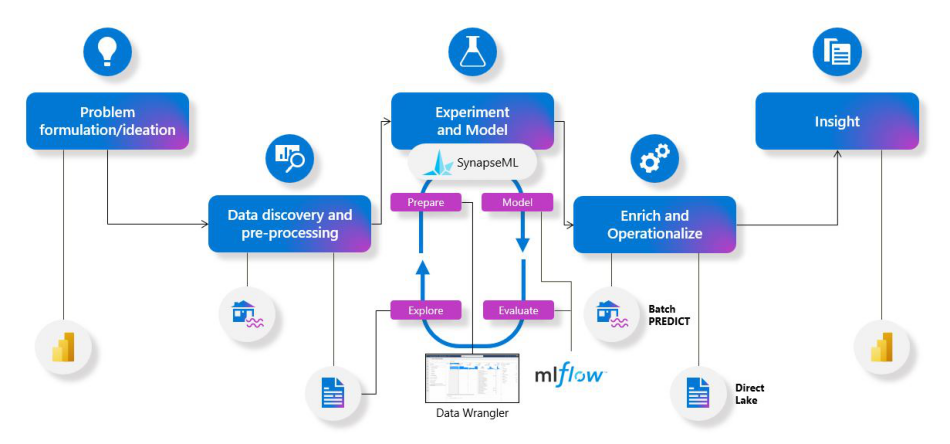

In [1]:
# Drag & Drop the image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
# Load image
image = mpimg.imread("/lakehouse/default/" + "Files/data/DS_Assets/microsoft-fabric-data-science-process.jpg")
plt.figure(figsize=(12, 10))
# Let the axes disappear
plt.axis('off')
# Plot image in the output
image_plot = plt.imshow(image)  

##### Step 0: Installation and Imports

We import libraries to access pre-written code built by other developers. This code can be used to add functionality to our own programs without having to write it all from scratch. Examples of libraries include math libraries, image processing libraries, and web application frameworks.

In [2]:
#Install required libraries
%pip install mlflow

StatementMeta(, 271a8094-c5a1-48ac-9ae9-9df41ee3e74a, 9, Finished, Available)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.1/18.1 MB 94.2 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 88.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 35.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 39.5 MB/s eta 0:00:00

[notice] A new release of pip is available: 23.0 -> 23.1.2
[notice] To update, run: /nfs4/pyenv-54987d79-5005-44b8-99ab-3127177ae348/bin/python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [3]:
import numpy as np
import pandas as pd

# Loading MLflow libraries
import mlflow
from mlflow.models.signature import infer_signature
from lightgbm import LGBMClassifier

# Loading packages for building a Machine Learning pipeline
from sklearn.model_selection import train_test_split
from sklearn import metrics
from pyspark.sql.functions import col
from pyspark.sql.types import IntegerType, DoubleType
from pyspark.ml.evaluation import BinaryClassificationEvaluator

# Loading libraries for visualization
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
import IPython.display as display
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']

from synapse.ml.lightgbm import LightGBMClassifier
from synapse.ml.automl import TuneHyperparameters
from synapse.ml.train import ComputeModelStatistics
from synapse.ml.predict import MLFlowTransformer
import lightgbm as lgb

from synapse.ml.train import TrainClassifier
from pyspark.ml.classification import (
    LogisticRegression,
    RandomForestClassifier,
    GBTClassifier
)

from synapse.ml.automl import *

print("All Modules Loaded")

StatementMeta(, 271a8094-c5a1-48ac-9ae9-9df41ee3e74a, 11, Finished, Available)

All Modules Loaded


##### Step 1: Load customer churn (labeled) data from silver layer Delta tables into Spark DataFrame

In [4]:
#Drag and drop - to get spark df
#remove 'LIMIT 1000' from query to get complete data
df = spark.sql("SELECT * FROM lakehouseSilver.dlt_silver_customerchurn_data")
# display(df)

StatementMeta(, 271a8094-c5a1-48ac-9ae9-9df41ee3e74a, 12, Finished, Available)

## Visualize Spark DataFrame  
Gif below show out-of-the-box DataFrame visualization options available in Microsoft Fabric notebook. Chart view in Microsoft Fabric provides an interactive visualization interface for exploring and analyzing data. It offers a variety of chart types and customization options to create insightful visualizations that help in understanding patterns, trends, and relationships within the data.

StatementMeta(, 271a8094-c5a1-48ac-9ae9-9df41ee3e74a, 13, Finished, Available)

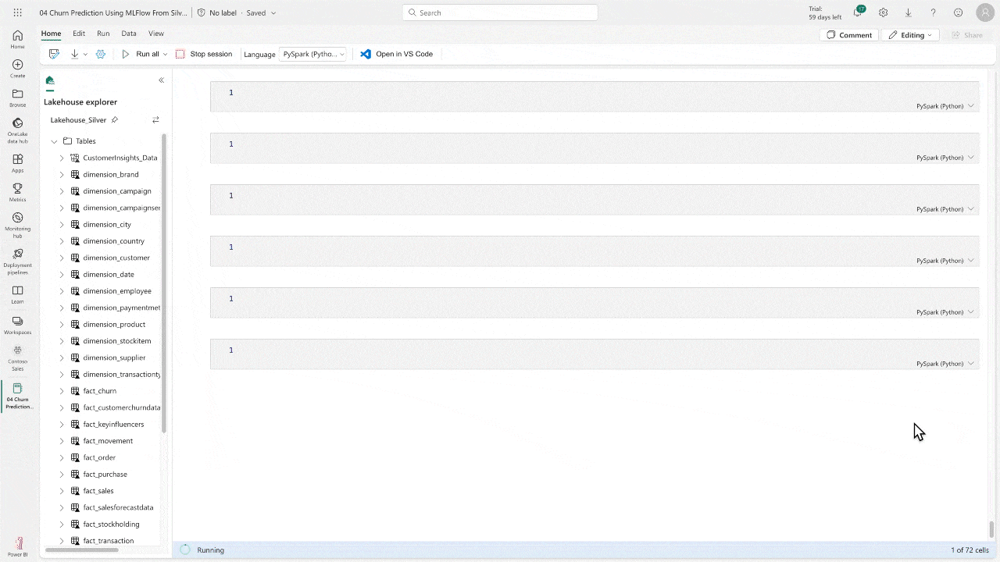

In [5]:
# Provide the path to your GIF file
gif_path = "/lakehouse/default/Files/data/DS_Assets/Chart_View.gif"

# Display the GIF in the notebook
display.Image(filename=gif_path, format='gif')

#### Step 2: Accelerate data prep with Data Wrangler in Microsoft Fabric

Data Wrangler is a notebook-based tool that provides users with an immersive experience to conduct exploratory data analysis. The feature combines a grid-like data display with dynamic summary statistics, built-in visualizations, and a library of common data-cleaning operations. Each operation can be applied in a matter of clicks, updating the data display in real time and generating code that can be saved back to the notebook as a reusable function.

Data preparation is essential for successful machine learning because it allows the machine learning algorithm to work efficiently and effectively. In this step we are going to change the data type, remove columns which are not essential for traing and resetting the index. These tasks help make sure that the data is clean, consistent, and ready for machine learning. Data preparation helps reduce noise and improve the quality of the data, which helps improve the accuracy of the machine learning algorithms. 

Additionally, data preparation will help reduce the time needed to train the machine learning model, making it faster and more efficient.

The null values from **TotalAmount** column are dropped.

**CustomerID** column is dropped.

**TotalAmount**, **UnitPrice** and **tenure** are converted from string to numeric, using the user defined function given by Data Wrangler

In the below gif, gives the experience of Data Wrangling process


StatementMeta(, 271a8094-c5a1-48ac-9ae9-9df41ee3e74a, 14, Finished, Available)

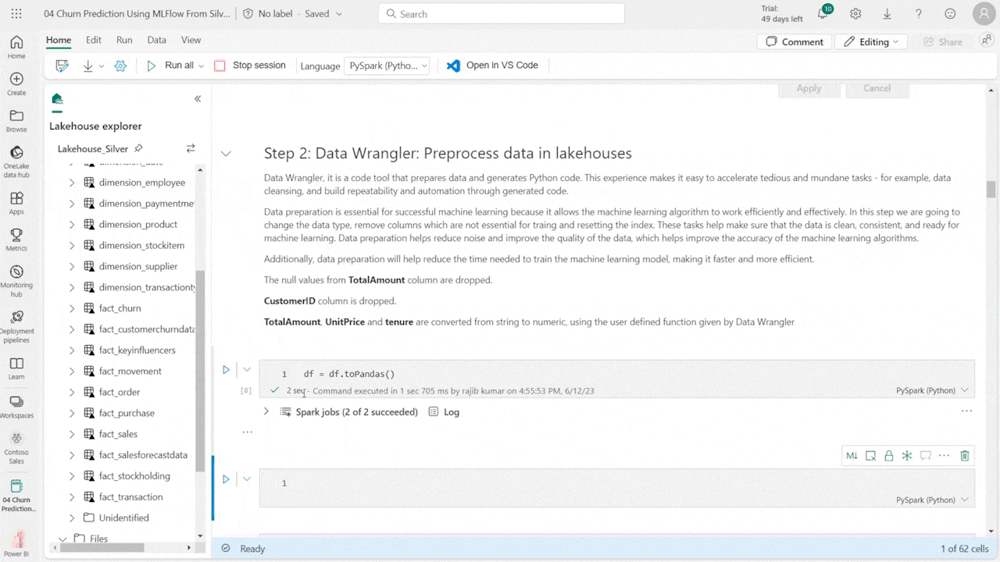

In [6]:
# Provide the path to your GIF file
gif_path = "/lakehouse/default/Files/data/DS_Assets/Data_Wrangler.gif"

# Display the GIF in the notebook
display.Image(filename=gif_path, format='gif')

In [7]:
#Data Wrangling function
df = df.toPandas()

def clean_data(df):
    
    # Drop rows with missing data in column: 'TotalAmount'
    df = df.dropna(subset=['TotalAmount'])
    # Drop column: 'CustomerID'
    df = df.drop(columns=['CustomerID'])
    # Change column type to float32 for column: 'UnitPrice'
    df = df.astype({'UnitPrice': 'float32'})
    # Change column type to int32 for column: 'tenure'
    df = df.astype({'tenure': 'int32'})
    return df

df = clean_data(df.copy())
df['TotalAmount'] = pd.to_numeric(df['TotalAmount'], errors="coerce")
df.head()

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 9, Finished, Available)

,Gender,SeniorCitizen,Partner,Dependents,tenure,Discount,OutletSize,OnlineDelivery,OrderStatus,CustomerSupport,Brand,StoreContract,PaperlessBilling,PaymentMethod,UnitPrice,TotalAmount,Churn
0,Male,0,No,No,45,No,Big,Yes,Shipped,Yes,Local,One year,No,Bank transfer (automatic),42.299999,1840.75,No
1,Female,0,No,No,42,No,Big,Yes,Shipped,Yes,Local,One year,Yes,Electronic check,54.750000,2348.45,No
2,Female,0,No,No,11,No,Big,No,Shipped,Yes,Local,One year,Yes,Credit card (automatic),40.400002,422.60,No
3,Female,0,No,No,40,No,Big,Yes,Shipped,Yes,National,One year,Yes,Bank transfer (automatic),54.549999,2236.20,No
4,Male,0,No,Yes,63,No,Big,Yes,Shipped,Yes,Local,One year,Yes,Bank transfer (automatic),40.599998,2588.95,No


##### Step 3: Exploratory Data Analysis

Exploratory Data Analysis (EDA) examines and explores a given data set to uncover patterns, draw conclusions, and identify meaningful insights. This process requires analyzing the data to summarize and visualize it in such a way that the data can be better understood. 

EDA is an important part of the process, as it helps to identify the underlying structure of the data and provides insights into any trends or relationships that may exist. Also EDA helps to identify important features of the data and to identify areas of further inquiry.

As the length of time customers remain with a company, measured in months, increases and their overall expenditure rises, we can observe a corresponding decline in the number of customers who choose to discontinue their service with the company, i.e. churn.

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 10, Finished, Available)

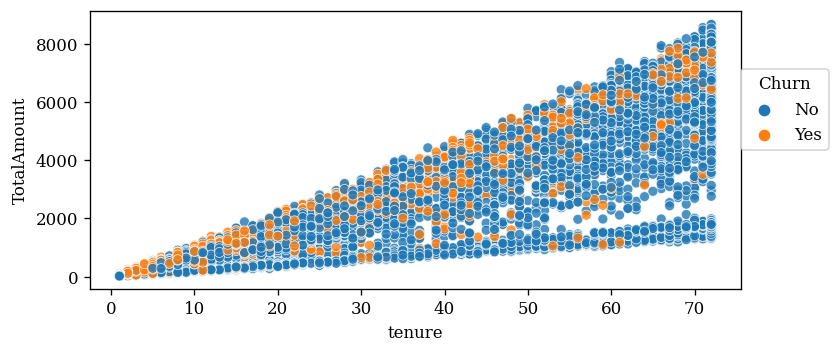

In [8]:
# Churn rate with tenure and Total amount spend
plt.figure(figsize=(7,3),dpi=120)
sns.scatterplot(data=df,x='tenure',y='TotalAmount',hue='Churn',alpha=0.8)
plt.legend(loc=(1,0.5),title = "Churn")

Feature correlation measures the relationship between two or more features in a dataset.
It helps identify the degree and direction of their association, aiding in understanding dependencies and patterns in the data.

Here, we are ploting correlation of the fetures with respect to customer likely to churn






StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 11, Finished, Available)

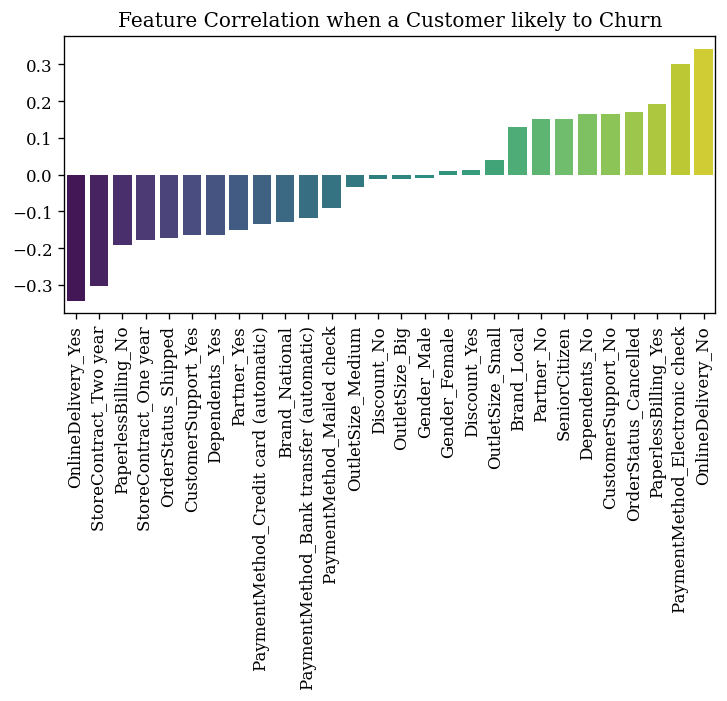

In [9]:
# Feature Correlation
df_corr  = pd.get_dummies(df[['Gender', 'SeniorCitizen', 'Partner', 'Dependents','Discount', 'OutletSize', 'OnlineDelivery',
       'OrderStatus', 'CustomerSupport', 'Brand', 'StoreContract', 'PaperlessBilling',
       'PaymentMethod','Churn']]).corr()
# Feature Correlation when Churn = Yes
plt.figure(figsize=(7,3),dpi=120)
sns.barplot(x=df_corr['Churn_Yes'].sort_values().iloc[1:-2].index,y=df_corr['Churn_Yes'].sort_values().iloc[1:-2].values,palette='viridis')
plt.title('Feature Correlation when a Customer likely to Churn')
plt.xticks(rotation=90);

##### Step 4: Build an ML model and track experiment run with MLFlow



###### 4.1: Build Base Model and Hyperparameter Tune

In [10]:
logReg = LogisticRegression()
randForest = RandomForestClassifier()
gbt = GBTClassifier()
lightgbm = LightGBMClassifier()

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 12, Finished, Available)

In [11]:
EXPERIMENT_NAME = "07-churn-prediction-experiment"
MODEL_NAME = "08-churn-prediction-model-using-lightgbm"
TARGET_COL = "Churn"

smlmodels = [logReg,randForest,gbt,lightgbm]
mmlmodels = [TrainClassifier(model=model, labelCol=TARGET_COL) for model in smlmodels]

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 13, Finished, Available)

In [12]:
paramBuilder = (

    HyperparamBuilder()
    .addHyperparam(logReg, logReg.regParam, RangeHyperParam(0.1, 0.3))
    .addHyperparam(randForest, randForest.numTrees, DiscreteHyperParam([5, 10]))
    .addHyperparam(randForest, randForest.maxDepth, DiscreteHyperParam([3, 5]))
    .addHyperparam(gbt, gbt.maxBins, RangeHyperParam(8, 16))
    .addHyperparam(gbt, gbt.maxDepth, DiscreteHyperParam([3, 5]))
    .addHyperparam(lightgbm, lightgbm.baggingFraction, DiscreteHyperParam([0.8,1]))
    )

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 14, Finished, Available)

In [13]:
searchSpace = paramBuilder.build()

# The search space is a list of params to tuples of estimator and hyperparam

print(searchSpace)

randomSpace = RandomSpace(searchSpace)

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 15, Finished, Available)

dict_items([(Param(parent='LogisticRegression_8ca843369756', name='regParam', doc='regularization parameter (>= 0).'), (LogisticRegression_8ca843369756, <synapse.ml.automl.HyperparamBuilder.RangeHyperParam object at 0x7f74c387b940>)), (Param(parent='RandomForestClassifier_14592b743822', name='numTrees', doc='Number of trees to train (>= 1).'), (RandomForestClassifier_14592b743822, <synapse.ml.automl.HyperparamBuilder.DiscreteHyperParam object at 0x7f74c3983220>)), (Param(parent='RandomForestClassifier_14592b743822', name='maxDepth', doc='Maximum depth of the tree. (>= 0) E.g., depth 0 means 1 leaf node; depth 1 means 1 internal node + 2 leaf nodes. Must be in range [0, 30].'), (RandomForestClassifier_14592b743822, <synapse.ml.automl.HyperparamBuilder.DiscreteHyperParam object at 0x7f74be875210>)), (Param(parent='GBTClassifier_75d958bbf07b', name='maxBins', doc='Max number of bins for discretizing continuous features.  Must be >=2 and >= number of categories for any categorical feature.

In [14]:
data = spark.createDataFrame(df)
bestModel = TuneHyperparameters(

    evaluationMetric="accuracy",
    models=mmlmodels,
    numFolds=2,
    numRuns=len(mmlmodels) * 1,
    parallelism=1,
    paramSpace=randomSpace.space(),
    seed=0,

).fit(data)

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 16, Finished, Available)

/opt/spark/python/lib/pyspark.zip/pyspark/sql/pandas/conversion.py:604: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  [(c, t) for (_, c), t in zip(pdf_slice.iteritems(), arrow_types)]
2023-06-15:19:26:06,898 ERROR    [synapse_mlflow_utils.py:398] [fabric mlflow plugin]: <class 'synapse.ml.mlflow.tracking_store.TridentMLflowTrackingStore'>.create_experiment exception
2023-06-15:19:26:06,900 ERROR    [default_experiment_registry.py:61] Error find or created notebook default experiment, please call mlflow.set_experiment to set a valid one before run
Traceback (most recent call last):
  File "/home/trusted-service-user/cluster-env/trident_env/lib/python3.10/site-packages/synapse/ml/mlflow/default_experiment_registry.py", line 59, in get_experiment_id
    return mlflow.set_experiment(f"{notebook_name}").experiment_id
  File "/home/trusted-service-user/cluster-env/trident_env/lib/python3.10/site-packages/mlflow/tracking/fluent.py", line

In [15]:
print(bestModel.getBestModelInfo())
print(bestModel.getBestModel())

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 17, Finished, Available)

cacheNodeIds: false, checkpointInterval: 10, featureSubsetStrategy: all, featuresCol: TrainClassifier_22042caece6d_features, impurity: variance, labelCol: Churn, leafCol: , lossType: logistic, maxBins: 9, maxDepth: 3, maxIter: 20, maxMemoryInMB: 256, minInfoGain: 0.0, minInstancesPerNode: 1, minWeightFractionPerNode: 0.0, predictionCol: prediction, probabilityCol: probability, rawPredictionCol: rawPrediction, seed: 3504127614838123891, stepSize: 0.1, subsamplingRate: 1.0, validationTol: 0.01
TrainClassifierModel_90ef2d401002



###### 4.2: Splitting Data

Splitting the data into training and testing datasets allows us to evaluate how well the model generalizes to unseen data. The training dataset is used to build the model, while the test dataset is used to evaluate how well the model performs on unseen data. 

Here we are splitting the data into 60-40, with 60% of the data used in training and the rest 40% to test the model performance.

In [16]:
# Encoding churn as 0 and 1, Churn = 1 and Not churn = 0
df['Churn'] = df['Churn'].apply(lambda x: 0 if x=='No' else 1)

# separating dependent and independent variables
X= pd.get_dummies(df.drop(['Churn'],axis=1),drop_first=True, dtype='int64')
y= df['Churn']

# Split out the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.40, random_state=42)

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 18, Finished, Available)

###### 4.3: Build Final Model

LightGBM is an open-source boosting algorithm for gradient boosting machines developed by Microsoft. It is a supervised machine learning algorithm that uses decision tree-based learning algorithms.

The algorithm is designed to be fast and efficient, and to produce better results than other existing boosting algorithms. It is also designed to be memory-efficient, so it can handle large datasets. LightGBM can be used for both classification and regression tasks.

The churn_model variable will be used to refer to this instance of the classifier.

In [17]:
# Best model parameters from tuned model

lgb_model = LGBMClassifier(
    
bagging_fraction=1.0, bagging_freq=7, 
boosting_type='gbdt', class_weight=None, 
colsample_bytree=1.0, feature_fraction=0.4, 
importance_type='split', learning_rate=0.05, 
max_depth=-1, min_child_samples=71, 
)

lgb_model

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 19, Finished, Available)

LGBMClassifier(bagging_fraction=1.0, bagging_freq=7, feature_fraction=0.4,
               learning_rate=0.05, min_child_samples=71)

In this cell  a churn_model is being fit using X_train and y_train. The model is being evaluated using X_test and y_test with the metric "auc" and a callback with logging the evaluation every 10 steps.  The churn_model is then fitted to the data.

In [18]:
print(f"\n\nTraining using the train dataset Started:\n")
churn_model = lgb_model.fit(
    X_train,
    y_train,
    eval_set=[(X_test, y_test)],
    eval_metric="auc",
    callbacks=[
        lgb.log_evaluation(10),
    ],
)

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 20, Finished, Available)

2023-06-15:19:27:51,309 WARNING  [tracking_store.py:99] Name conflict. Try to use another name for your experiment. Or rename your notebook if you are creating notebook's default experiment
2023-06-15:19:27:51,309 ERROR    [synapse_mlflow_utils.py:398] [fabric mlflow plugin]: <class 'synapse.ml.mlflow.tracking_store.TridentMLflowTrackingStore'>.create_experiment exception
2023-06-15:19:27:51,311 ERROR    [default_experiment_registry.py:61] Error find or created notebook default experiment, please call mlflow.set_experiment to set a valid one before run
Traceback (most recent call last):
  File "/home/trusted-service-user/cluster-env/trident_env/lib/python3.10/site-packages/synapse/ml/mlflow/default_experiment_registry.py", line 59, in get_experiment_id
    return mlflow.set_experiment(f"{notebook_name}").experiment_id
  File "/home/trusted-service-user/cluster-env/trident_env/lib/python3.10/site-packages/mlflow/tracking/fluent.py", line 121, in set_experiment
    experiment_id = client



Training using the train dataset Started:

[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[10]	valid_0's auc: 0.841078	valid_0's binary_logloss: 0.499367
[20]	valid_0's auc: 0.844816	valid_0's binary_logloss: 0.459219
[30]	valid_0's auc: 0.847862	valid_0's binary_logloss: 0.440485
[40]	valid_0's auc: 0.848317	valid_0's binary_logloss: 0.427001
[50]	valid_0's auc: 0.849243	valid_0's binary_logloss: 0.418867
[60]	valid_0's auc: 0.848666	valid_0's binary_logloss: 0.415723
[70]	valid_0's auc: 0.848268	valid_0's binary_logloss: 0.414157
[80]	valid_0's auc: 0.847243	valid_0's binary_logloss: 0.414196
[90]	valid_0's auc: 0.846879	valid_0's binary_logloss: 0.413966
[100]	valid_0's auc: 0.846019	

###### 4.4: Understanding Model - Feature Importance

Model feature importance is a technique used to determine the significance of different features in a machine learning model.

It helps identify which features have the most influence on the model's predictions, providing insights into the key factors driving the model's performance.

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 21, Finished, Available)

<AxesSubplot: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

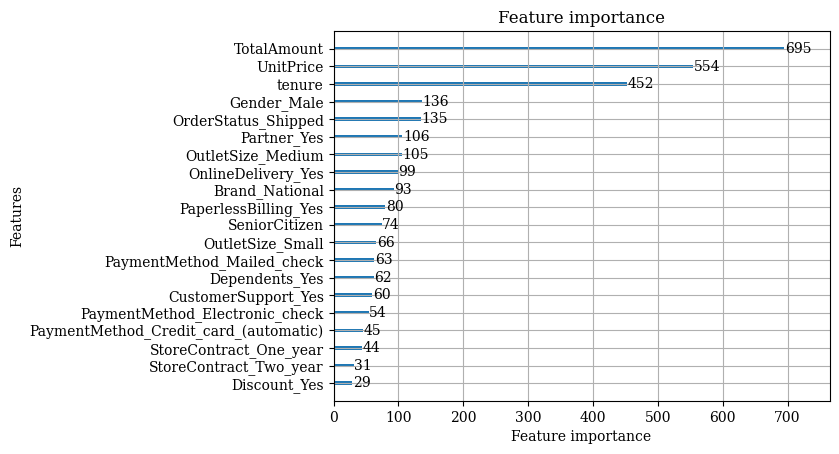

In [19]:
lgb.plot_importance(churn_model)


###### 4.5: Evaluating the Model

In this cell TARGET_COL is being set equal to "Churn". feature_cols is being set to a list of all the columns in X_test, excluding the column labeled "Churn". This is being done so that the variable feature_cols can be used to select all columns in X_test for analysis, except for the column labeled "Churn", which is the target column.

In [20]:
TARGET_COL = "Churn"
feature_cols = [c for c in X_test.columns.tolist() if c not in [TARGET_COL]]

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 22, Finished, Available)

Here we are defining a function prediction_to_spark() which is a function that takes in a model and a test set as its parameters. It creates a list of feature columns using the columns from the test set. It uses the model to make predictions on the test set. Finally, it creates a tuple of the target column and the predictions and creates a DataFrame from this tuple. The target and prediction columns are then cast to the appropriate data types.

The function then returns the DataFrame which contains the predictions.

In [21]:
def prediction_to_spark(model, test):
    feature_cols = [c for c in test.columns.tolist() if c not in [TARGET_COL]]
    predictions = model.predict(test[feature_cols], num_iteration=model.best_iteration_)
    predictions = tuple(zip(test[TARGET_COL].tolist(), predictions.tolist()))
    dataColumns = [TARGET_COL, "prediction"]
    predictions = (
        spark.createDataFrame(data=predictions, schema=dataColumns)
        .withColumn(TARGET_COL, col(TARGET_COL).cast(IntegerType()))
        .withColumn("prediction", col("prediction").cast(DoubleType()))
    )

    return predictions

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 23, Finished, Available)

The code is combining the training and testing data sets, X_train and X_test, into one dataframe called **processed_df**. 
It is then using the churn_model to make a prediction from the processed_df dataframe. The prediction is being stored in a dataframe called predictions. 
The original dataframe, df, is then being combined with the predictions dataframe to create a new dataframe called **new_df**.

In [22]:
train = pd.concat([X_train,y_train],axis=1)
test = pd.concat([X_test,y_test],axis=1)
processed_df = pd.concat([train,test])

pred = prediction_to_spark(churn_model, processed_df)
predictions = pred.toPandas()
predictions = predictions.drop(['Churn'],axis=1)
new_df = pd.concat([df,predictions],axis=1)

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 24, Finished, Available)

In the new_df dataframe we can see the predicted Churn feature, **Churn** as the last column.

In [23]:
new_df.head()

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 25, Finished, Available)

,Gender,SeniorCitizen,Partner,Dependents,tenure,Discount,OutletSize,OnlineDelivery,OrderStatus,CustomerSupport,Brand,StoreContract,PaperlessBilling,PaymentMethod,UnitPrice,TotalAmount,Churn,prediction
0,Male,0,No,No,45,No,Big,Yes,Shipped,Yes,Local,One year,No,Bank transfer (automatic),42.299999,1840.75,0,0.0
1,Female,0,No,No,42,No,Big,Yes,Shipped,Yes,Local,One year,Yes,Electronic check,54.750000,2348.45,0,0.0
2,Female,0,No,No,11,No,Big,No,Shipped,Yes,Local,One year,Yes,Credit card (automatic),40.400002,422.60,0,0.0
3,Female,0,No,No,40,No,Big,Yes,Shipped,Yes,National,One year,Yes,Bank transfer (automatic),54.549999,2236.20,0,0.0
4,Male,0,No,Yes,63,No,Big,Yes,Shipped,Yes,Local,One year,Yes,Bank transfer (automatic),40.599998,2588.95,0,0.0


This below code is creating an object called "metrics" which is a transformation of the pred object. The transformation is being done using the ComputeModelStatistics() function which uses the evaluationMetric "classification", the labelCol TARGET_COL, and the scoredLabelsCol "Prediction".

In [24]:
metrics = ComputeModelStatistics(
    evaluationMetric="classification", labelCol=TARGET_COL, scoredLabelsCol="prediction"
).transform(pred)

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 26, Finished, Available)

###### 4.5.1: Confusion Metrix

The below code is selecting the confusion matrix from the 'metrics' object and converting it into an array and using the Seaborn library, created a heatmap of a confusion matrix. 
The confusion matrix is an array of numbers that represent the correct and incorrect predictions of a machine learning classifier. 

The heatmap is used to visualize the data in the confusion matrix in an easier to understand format. The figure size and titles are being set for the heatmap, as well as the labels for the x and y axes.

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 27, Finished, Available)

[[4807.  367.]
 [ 868. 1001.]]


Text(41.25, 0.5, 'True label')

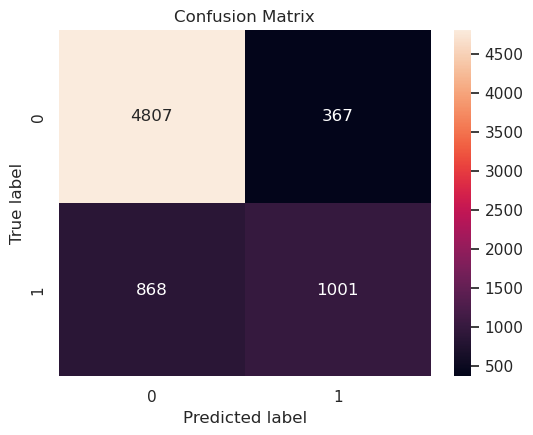

In [25]:
cm = metrics.select("confusion_matrix").collect()[0][0].toArray()
print(cm)
sns.set(rc={"figure.figsize": (6, 4.5)})
ax = sns.heatmap(cm, annot=True, fmt=".20g")
ax.set_title("Confusion Matrix")
ax.set_xlabel("Predicted label")
ax.set_ylabel("True label")

###### 4.5.2: AUROC/AUPRC

This function is used to evaluate the model performance. It uses **BinaryClassificationEvaluator** to calculate the AUROC and AUPRC metrics. AUROC stands for Area Under the Receiver Operating Characteristic curve and AUPRC stands for Area Under the Precision-Recall Curve. 

These metrics are used to evaluate the performance of a binary classification model. The function prints out the AUROC and AUPRC scores and returns them as a tuple.

AUROC stands for Area Under the Receiver Operating Characteristic curve and AUPRC stands for Area Under the Precision-Recall Curve. These metrics are used to evaluate the performance of a binary classification model. 

AUROC measures how well the model can distinguish between classes and AUPRC measures the model's precision and recall.

In [26]:
def evaluate(predictions):
    """
    Evaluate the model by computing AUROC and AUPRC with the predictions.
    """
    # initialize the binary evaluator
    evaluator = BinaryClassificationEvaluator(
        rawPredictionCol="prediction", labelCol=TARGET_COL)
    _evaluator = lambda metric: evaluator.setMetricName(metric).evaluate(predictions)

    # calculate AUROC, baseline 0.5
    auroc = _evaluator("areaUnderROC")
    print(f"AUROC: {auroc:.4f}")
    
    # calculate AUPRC, baseline positive rate (0.172% in the demo data)
    auprc = _evaluator("areaUnderPR")
    print(f"AUPRC: {auprc:.4f}")
    return auroc, auprc

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 28, Finished, Available)

In [27]:
auroc, auprc = evaluate(pred)

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 29, Finished, Available)

AUROC: 0.7323
AUPRC: 0.6234


This code is defining a variable called "signature" that stores the output of a function called "infer_signature". The function takes two parameters, X_test and a NumPy array that contains the output of a prediction model called "churn_model" when it is run on the X_test data.

The output of the function is then used to set an experiment in MLflow with the name EXPERIMENT_NAME, which has been defined above.

In [28]:
signature = infer_signature(
    X_test,
    np.array(
        churn_model.predict(X_test, num_iteration=churn_model.best_iteration_),
        dtype="int_",
    ),
)

mlflow.set_experiment(EXPERIMENT_NAME)

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 30, Finished, Available)

/home/trusted-service-user/cluster-env/trident_env/lib/python3.10/site-packages/mlflow/models/signature.py:130: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  inputs = _infer_schema(model_input)


<Experiment: artifact_location='', creation_time=1686855320716, experiment_id='c6b79419-63b3-4cb9-a1d3-5c64b990a452', last_update_time=None, lifecycle_stage='active', name='07-churn-prediction-experiment', tags={}>

##### Step 5: Log ML model in the built-in model registry using MLFlow

The code is logging the model, metrics and parameters used for the churn model. The model, metrics and parameters are stored as variables (churn_model, auprc, auroc, data_enhancements, EXPERIMENT_NAME) and are then logged using the mlflow library.

The code logs the model using the log_model function, and the metrics using the log_metrics functions respectively.


In [29]:
# log model, metrics and params
raw_model_info = [churn_model, auprc, auroc]
data_enhancements = ["None", "SMOTE"]
for idx, info in enumerate([raw_model_info]):
    model, auprc, auroc = info
    with mlflow.start_run(nested=True) as run:
        print("log model:")
        mlflow.lightgbm.log_model(
            model,
            f"{MODEL_NAME}",
            registered_model_name=f"{MODEL_NAME}",
            signature=signature,
        )
        print("log metrics:")
        mlflow.log_metrics({"AUPRC": auprc, "AUROC": auroc})
        
        model_uri = f"runs:/{run.info.run_id}/{MODEL_NAME}"
        print("Model saved in run %s" % run.info.run_id)
        print(f"Model URI: {model_uri}")

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 31, Finished, Available)

log model:
log metrics:
Model saved in run dd4637d2-97e7-49ce-aabc-c7ccde3cdbdd
Model URI: runs:/dd4637d2-97e7-49ce-aabc-c7ccde3cdbdd/08-churn-prediction-model-using-lightgbm


/home/trusted-service-user/cluster-env/trident_env/lib/python3.10/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
Successfully registered model '08-churn-prediction-model-using-lightgbm'.
2023/06/15 19:28:10 INFO mlflow.tracking._model_registry.client: Waiting up to 300 seconds for model version to finish creation.                     Model name: 08-churn-prediction-model-using-lightgbm, version 2
Created version '2' of model '08-churn-prediction-model-using-lightgbm'.


##### Step 6: Run batch scoring on Spark with scalable PREDICT UDF

###### Calling PREDICT from a notebook (PREDICT with the Transformer API)

In [30]:
spark.conf.set("spark.synapse.ml.predict.enabled", "true")

model = MLFlowTransformer(
    inputCols=feature_cols,
    outputCol="prediction",
    modelName=f"{MODEL_NAME}",
    modelVersion=1,
)
print(model)

test_df = spark.createDataFrame(data=test, schema=test.columns.to_list())
batch_predictions = model.transform(test_df)

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 32, Finished, Available)

MLFlowTransformer_9106a5cf9084


/opt/spark/python/lib/pyspark.zip/pyspark/sql/pandas/functions.py:394: UserWarning: In Python 3.6+ and Spark 3.0+, it is preferred to specify type hints for pandas UDF instead of specifying pandas UDF type which will be deprecated in the future releases. See SPARK-28264 for more details.
/opt/spark/python/lib/pyspark.zip/pyspark/sql/pandas/conversion.py:604: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  [(c, t) for (_, c), t in zip(pdf_slice.iteritems(), arrow_types)]


In [31]:
predicted_data = batch_predictions.select(col("tenure").alias("Tenure"),col("UnitPrice").alias("UnitPrice"),
            col("TotalAmount").alias("TotalAmount"),col("Gender_Male").alias("GenderMale"),col("SeniorCitizen").alias("SeniorCitizen"),
            col("Partner_Yes").alias("PartnerYes"),col("Dependents_Yes").alias("DependentsYes"),col("Discount_Yes").alias("DiscountYes"),
            col("OutletSize_Medium").alias("OutletSizeMedium"),col("OutletSize_Small").alias("OutletSizeSmall"),col("OnlineDelivery_Yes").alias("OnlineDeliveryYes"),
            col("OrderStatus_Shipped").alias("OrderStatusShipped"),col("CustomerSupport_Yes").alias("CustomerSupportYes"),col("Brand_National").alias("BrandNational"),
            col("StoreContract_One year").alias("StoreContractOneYear"),col("PaperlessBilling_Yes").alias("PaperlessBillingYes"),col("PaymentMethod_Credit card (automatic)").alias("PaymentMethodCreditcardAutomatic"),
            col("PaymentMethod_Electronic check").alias("PaymentMethodElectronicCheck"),col("PaymentMethod_Mailed check").alias("PaymentMethodMailedCheck"), 
            col("Churn").alias("Churn"),col("prediction").alias("PredictedChurn"))

          
predicted_data.head(3)

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 33, Finished, Available)

[Row(Tenure=49, UnitPrice=84.3499984741211, TotalAmount=4059.35, GenderMale=1, SeniorCitizen=0, PartnerYes=1, DependentsYes=0, DiscountYes=1, OutletSizeMedium=0, OutletSizeSmall=1, OnlineDeliveryYes=1, OrderStatusShipped=0, CustomerSupportYes=1, BrandNational=1, StoreContractOneYear=1, PaperlessBillingYes=0, PaymentMethodCreditcardAutomatic=0, PaymentMethodElectronicCheck=1, PaymentMethodMailedCheck=0, Churn=1, PredictedChurn=0),
 Row(Tenure=23, UnitPrice=40.099998474121094, TotalAmount=857.75, GenderMale=1, SeniorCitizen=0, PartnerYes=0, DependentsYes=1, DiscountYes=0, OutletSizeMedium=0, OutletSizeSmall=0, OnlineDeliveryYes=1, OrderStatusShipped=0, CustomerSupportYes=1, BrandNational=0, StoreContractOneYear=0, PaperlessBillingYes=0, PaymentMethodCreditcardAutomatic=0, PaymentMethodElectronicCheck=0, PaymentMethodMailedCheck=1, Churn=0, PredictedChurn=0),
 Row(Tenure=11, UnitPrice=96.19999694824219, TotalAmount=1222.05, GenderMale=0, SeniorCitizen=0, PartnerYes=1, DependentsYes=0, Dis

##### Step 7: Store predictions in the Lakehouse (Delta parquet)

Storing predictions in the Lakehouse (Delta parquet) format allows for efficient and scalable storage of prediction results. 

In [32]:
predicted_data.toPandas().tail()

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 34, Finished, Available)

,Tenure,UnitPrice,TotalAmount,GenderMale,SeniorCitizen,PartnerYes,DependentsYes,DiscountYes,OutletSizeMedium,OutletSizeSmall,...,OrderStatusShipped,CustomerSupportYes,BrandNational,StoreContractOneYear,PaperlessBillingYes,PaymentMethodCreditcardAutomatic,PaymentMethodElectronicCheck,PaymentMethodMailedCheck,Churn,PredictedChurn
2813,54,46.200001,2431.95,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
2814,56,104.750000,5841.35,0,1,0,0,1,0,1,...,1,0,1,0,0,0,1,0,0,0
2815,68,99.550003,6668.00,1,0,1,1,1,1,0,...,0,1,1,0,1,0,1,0,0,0
2816,1,70.150002,70.15,0,0,0,0,1,1,0,...,0,0,0,0,1,0,0,1,1,1
2817,1,83.400002,83.40,0,0,0,0,1,1,0,...,1,1,0,0,1,0,0,1,0,1


In [33]:
# Delta table
table_name = 'Lakehouse_Gold.churn_predicteddata'

predicted_data.write.mode("overwrite").option("overwriteSchema", "true").format("delta").save("Tables/" + table_name)

StatementMeta(, 4d4fa6b8-37f8-45be-b3eb-e9e59762b286, 35, Finished, Available)